In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import csv

# import niezbędnych procedur pakietu scipy i scikit.learn
from scipy.cluster.hierarchy import linkage, dendrogram, ward, fcluster
from scipy.spatial.distance import cdist
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering,KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree

# pakiet mlxtend wymaga wcześniejszej instalacji
# w razie problemów z instalacją przez anaconda navigator-a
# należy w Anaconda prompt wpisać:
# pip install mlxtend   
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules


In [3]:
# reading data
crime = pd.read_csv('../test.csv', delimiter=',',index_col='Id')
crime.head()

crimeTrain = pd.read_csv('../train.csv', delimiter=',')
crimeTrain


,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541
...,...,...,...,...,...,...,...,...,...
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607


Dane przedstawiają zarejestrowane przestępstwa w San Francisco od 06-01-2003r do 13-05-2015r. Dla kazdego zarejestrowanego przestepstwa mamy podane:
* Kategorię
* Opis
* Datę 
* Dzień tygodnia
* Dzielnicę miasta
* Działania podjęte wobec sprawcy
* Adres
* Współrzędne (x,y) opisujące miejsce, w którym przestępstwo miało miejsce

Opis danych w postaci liczbowej:


In [4]:

# liczba obiektów
count_objs = crime.shape[0]
print("liczba obiektow:", count_objs)

# liczba klas
classes_count = crime.groupby('PdDistrict').ngroups
print("liczba klas:", classes_count)


# liczba obiektów w każdej klasie
class_counts = {}

for pd_district in crime['PdDistrict']:
    if pd_district not in class_counts:
        class_counts[pd_district] = 1
    else:
        class_counts[pd_district] += 1

arr = list(class_counts.values())

for i, count in enumerate(arr):
    print(f"klasa {arr[i]}: {count} objects")

# liczba atrybutów
attr_count = crime.count()
print("liczba atrybutow:", len(attr_count))

# liczba danych brakujących
i=0
for col in crime:
    for item in crime[col]:
        if(pd.isnull(item) == True):
            i+=1
null_data = i
print("liczba brakujacych danych:", null_data)

# usunięcie danych brakujących
crime = crime.iloc[:,:].dropna()

#usunięcie duplikatów
crime = crime.drop_duplicates()


liczba obiektow: 884262
liczba klas: 10
klasa 89591: 89591 objects
klasa 107017: 107017 objects
klasa 80084: 80084 objects
klasa 66617: 66617 objects
klasa 120449: 120449 objects
klasa 86130: 86130 objects
klasa 81747: 81747 objects
klasa 44972: 44972 objects
klasa 157456: 157456 objects
klasa 50199: 50199 objects
liczba atrybutow: 6
liczba brakujacych danych: 0


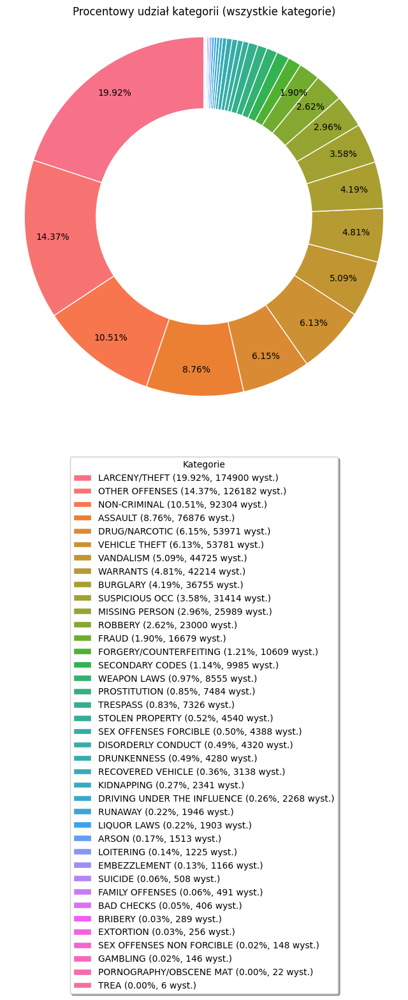

In [35]:
# Obliczanie procentów dla każdej kategorii
category_counts = crimeTrain['Category'].value_counts()
total_count = category_counts.sum()
percentages = category_counts / total_count * 100

# Używamy funkcji color_palette z seaborn do uzyskania różnych kolorów
colors = sns.color_palette("husl", n_colors=len(percentages))

# Wykres kołowy bez pustego miejsca w środku z legendą na dole
plt.figure(figsize=(8, 8))

# Tworzenie wykresu kołowego ze wszystkimi procentami
wedges, texts, autotexts = plt.pie(percentages, autopct=lambda p: f'{p:.2f}%' if p > 1.5 else '', startangle=90, pctdistance=0.85, wedgeprops=dict(width=0.4, edgecolor='w'), colors=colors)

# Legenda na dole z dokładnymi procentami dla wszystkich kategorii
#legend_labels = [f'{label} ({percent:.2f}%)' for label, percent in zip(percentages.index, percentages)]

legend_labels = [f'{label} ({percent:.2f}%, {count} wyst.)' for label, percent, count in zip(percentages.index, percentages, category_counts)]
plt.legend(wedges, legend_labels, title='Kategorie', loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

plt.title('Procentowy udział kategorii (wszystkie kategorie)')
plt.axis('equal')  # Ustawienie, aby koło było idealnie okrągłe
plt.show()


Jak mozemy zauwazyc, najczęściej popełnianymi przestępstwami w tym zbiorze danych są: 
* Kradziez *LARCENY/THEFT* (ponad 174tys. wystąpień, 19.92%)
* Inne wykroczenia *OTHER OFFENCES* (ponad 126tys. wystąpień, 14.37%)
* Przestępstwa niekryminalne *NON-CRIMINAL* (ponad 92tys. wystąpień, 10.51%) \
Najrzadziej występującym przestępstwem jest *TREA* (tłumaczenie nieznane), które wystąpiło zaledwie 6 razy (poniej 0.01%)

Zobaczmy teraz jak to wyglądało na przestrzeni lat:

<Figure size 1200x800 with 0 Axes>

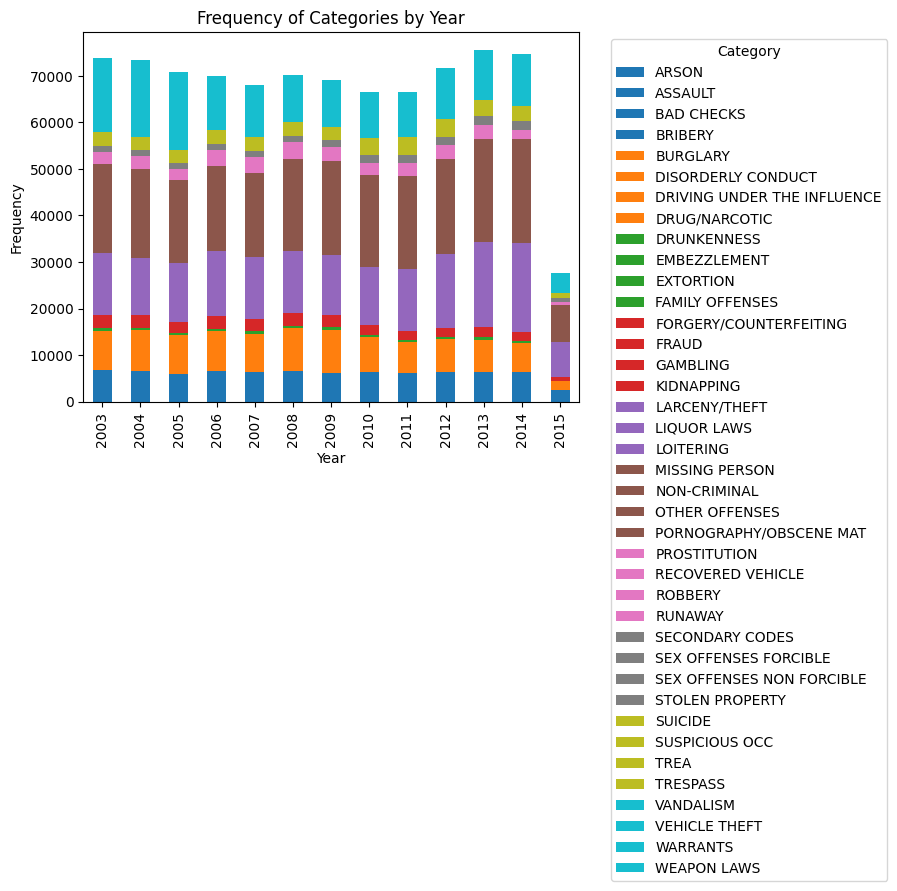

In [190]:
crimeTrain['Dates'] = pd.to_datetime(crimeTrain['Dates'])

# Dodaj kolumnę z rokiem
crimeTrain['Year'] = crimeTrain['Dates'].dt.year

# Liczba przestępstw dla każdej kategorii w poszczególnych latach
category_counts_by_year = crimeTrain.groupby(['Year', 'Category']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
category_counts_by_year.plot(kind='bar', stacked=True, cmap='tab10')
plt.title('Frequency of Categories by Year')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Mozna zaobserwować spadek liczby przestępstw od początku pomiarów, az do 2011 roku (z wyjątkiem skromnego wzrostu w 2008 i 2009 roku - prawdopodobnie spowodowanego światowym kryzysem ekonomicznym). \
Od 2011 roku, az do końca pomiarów liczba przestępstw systematycznie rosła. Dane z 2015 roku są niepełne, gdyz obejmują tylko okres do połowy maja, dlatego nie powinno się zwracać na nie uwagi w tym porównaniu.

Mozemy rowniez sprawdzic, czestotliwosc przestepstw w dane dni tygodnia

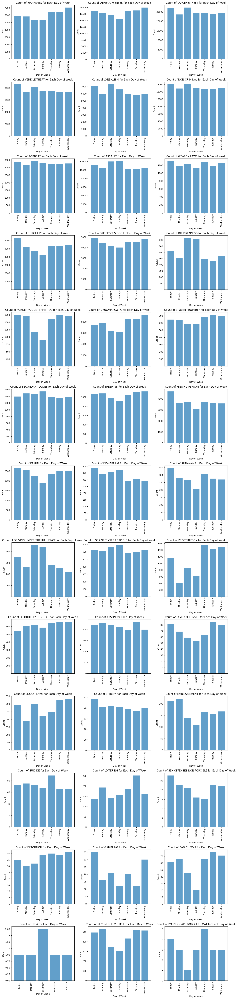

In [168]:
categories = crimeTrain['Category'].unique()

# Ustal liczbę kolumn (możesz dostosować)
num_columns = 3

# Ustal liczbę wierszy na podstawie liczby kategorii i liczby kolumn
num_rows = int(np.ceil(len(categories) / num_columns))

# Tworzenie macierzy subplotów
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))

# Również, konwertuj osie na jednowymiarową tablicę, jeśli liczba wierszy lub kolumn wynosi 1
if num_rows == 1:
    axes = np.reshape(axes, (1, -1))
if num_columns == 1:
    axes = np.reshape(axes, (-1, 1))

# Iteracja po kategoriach
for i, category in enumerate(categories):
    # Wybór odpowiedniego subplotu
    ax = axes[i // num_columns, i % num_columns]

    # Wybór danych dla danej kategorii
    category_data = crimeTrain[crimeTrain['Category'] == category]

    # Zliczanie wystąpień danej kategorii w danym dniu tygodnia
    grouped_data = category_data.groupby('DayOfWeek', observed=True).size()

    # Rysowanie wykresu z odpowiednią kolejnością dni tygodnia
    ax.bar(grouped_data.index, grouped_data, alpha=0.7)

    # Dodanie tytułu i etykiet
    ax.set_title(f'Count of {category} for Each Day of Week')
    ax.set_xlabel('Day of Week')
    ax.set_ylabel('Count')

    # Rotate x-axis labels
    ax.tick_params(axis='x', rotation=90)  # Obrót o 90 stopni

# Ustawienia layoutu
plt.tight_layout()
plt.show()

Jak mozna zobaczyc z wykresów przestepstwa takie jak:
* Kradzieze
* Porwania
* Rabunki
>Te wszystkie najczesciej występowały w weekend, gdzie ludzie zazwyczaj się bawią, co ma poparcie logiczne, gdyz pozostawione puste mieszkania sa idalnym czasem na działania kriminalne.

Zobaczmy teraz jakie kary były przyznawane za konkretne przestepstwa najczęsciej:

/tmp/ipykernel_771/2012488685.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 5))


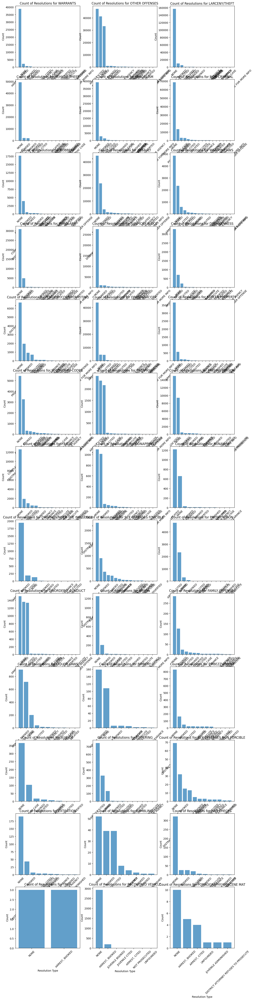

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [169]:
# Unikalne kategorie
categories = crimeTrain['Category'].unique()

# Ustal liczbę kolumn (możesz dostosować)
num_columns = 3

# Ustal liczbę wierszy na podstawie liczby kategorii i liczby kolumn
num_rows = int(np.ceil(len(categories) / num_columns))

# Tworzenie macierzy subplotów
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))

# Również, konwertuj osie na jednowymiarową tablicę, jeśli liczba wierszy lub kolumn wynosi 1
if num_rows == 1:
    axes = np.reshape(axes, (1, -1))
if num_columns == 1:
    axes = np.reshape(axes, (-1, 1))

# Iteracja po kategoriach
for i, category in enumerate(categories):
    plt.figure(figsize=(8, 5))

    # Wybór odpowiedniego subplotu
    ax = axes[i // num_columns, i % num_columns]
    
    # Select data for the current category
    category_data = crimeTrain[crimeTrain['Category'] == category]

    # Count occurrences of each resolution
    resolution_counts = category_data['Resolution'].value_counts()

    # Plot the bar graph for the current category
    ax.bar(resolution_counts.index, resolution_counts, alpha=0.7)

    # Add title and labels
    ax.set_title(f'Count of Resolutions for {category}')
    ax.set_xlabel('Resolution Type')
    ax.set_ylabel('Count')

    # Rotate x-axis labels
    ax.tick_params(axis='x', rotation=45)

# Ustawienia layoutu
plt.tight_layout()
plt.show()

W większości nie ma rozstrzygnięcia, co zapewne skala przestępstwa nie była duża, ale mimo tego, jako druga najczestsza kara jest areszt.
Reszta kar odnosi się dośc mocno do konkretnych przestepstw, jak naprzyklad:
* napaści - czesto jest kara zakazu zbliazania sie, lub przebywania w jakims obszarze
* proby samobjstw - przymusowe rozmowy z psychiatrami/psychologami
* zaginienie - przesiedlenia 
>Takie kategoryzowanie pozwala zauważyć, że można nauczyć model w celu kategoryzowania przetępstwa na podstawie kary, jednak czesto kary sie powtarzają, wiec dodatkowo uzyjemy lokalizacji, która jak wczesniej analizowalismy rowniez wyroznia sie dla poszczegolnych przestepstw

Standaryzacja danych

Sprawdzmy korelacje miedzy atrybutami:

In [170]:
#selected_columns = ['X', 'Y','Category']

#selected_data = crimeTrain[selected_columns]

#sns.pairplot(selected_data, hue = 'Category', kind = 'scatter')



In [171]:
crime_split_date = crimeTrain.copy()
crime_split_date['Date'] = pd.to_datetime(crime_split_date['Dates']).dt.date
crime_split_date['Date'] = crime_split_date['Date'].apply(lambda x: x.strftime('%Y-%m-%d'))
crime_split_date['Time'] = pd.to_datetime(crime_split_date['Dates']).dt.time
crime_split_date['Time'] = crime_split_date['Time'].apply(lambda x: x.strftime('%H-%M-%S'))

def day_string_to_int(day_str):
    if day_str == 'Monday':
        return 1
    elif day_str == 'Tuesday':
        return 2
    elif day_str == 'Wednesday':
        return 3
    elif day_str == 'Thursday':
        return 4
    elif day_str == 'Friday':
        return 5
    elif day_str == 'Saturday':
        return 6
    elif day_str == 'Sunday':
        return 7
    else:
        return None
crime_split_date['DayOfWeek']=crime_split_date['DayOfWeek'].apply(day_string_to_int)
crime_split_date = crime_split_date.drop('Dates', axis=1)
crime_split_date.dtypes

Category       object
Descript       object
DayOfWeek       int64
PdDistrict     object
Resolution     object
Address        object
X             float64
Y             float64
Year            int32
Date           object
Time           object
dtype: object

In [172]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Assuming 'crime_split_date' has both numeric and non-numeric columns
numeric_columns = crime_split_date.select_dtypes(include=['float64', 'int64']).columns

# Copy the DataFrame and normalize only the numeric columns
crime_normalized = crime_split_date.copy()

def convert_to_float(value):
    if type(value) == str:
        try:
            return float(hash(value))
        except ValueError:
            return value
    return value

# Applying the convert_to_float function to the DataFrame
crime_normalized = crime_normalized.applymap(convert_to_float)

# Applying MinMaxScaler only to numeric columns
crime_normalized[numeric_columns] = MinMaxScaler().fit_transform(crime_normalized[numeric_columns])

# Print or use the normalized DataFrame as needed
print(crime_normalized)
crimeTrain = crime_normalized

            Category      Descript  DayOfWeek    PdDistrict    Resolution  \
0       5.684824e+18 -3.015276e+18   0.333333 -6.723269e+18  2.634533e+18   
1      -3.437946e+18  2.270859e+18   0.333333 -6.723269e+18  2.634533e+18   
2      -3.437946e+18  2.270859e+18   0.333333 -6.723269e+18  2.634533e+18   
3      -1.449169e+18 -3.388475e+18   0.333333 -6.723269e+18 -7.363034e+16   
4      -1.449169e+18 -3.388475e+18   0.333333 -3.319969e+18 -7.363034e+16   
...              ...           ...        ...           ...           ...   
878044 -4.650507e+18  3.162061e+18   0.000000 -8.356743e+18 -7.363034e+16   
878045 -1.449169e+18 -3.388475e+18   0.000000 -6.937194e+18 -7.363034e+16   
878046 -1.449169e+18 -3.388475e+18   0.000000  1.130593e+18 -7.363034e+16   
878047  3.248929e+18  5.410189e+18   0.000000  1.130593e+18 -7.363034e+16   
878048 -9.043041e+18 -4.746806e+18   0.000000 -8.862190e+18 -7.363034e+16   

             Address         X         Y  Year          Date          Time 

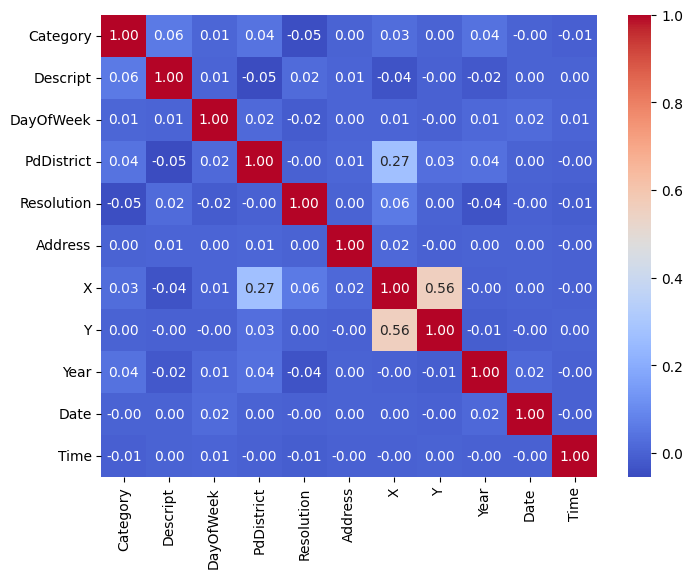

In [173]:
#macierz korelacji
plt.figure(figsize=(8,6))
sns.heatmap(crime_normalized.corr(), annot=True, cmap='coolwarm', fmt='0.2f')
plt.show()

Jak się można było spodziewać, najlepsza korelacje widzimy dla danych X i Y, oraz niewielka dla X i PdDistrict, zatem potrzebujemy dodatkowych atrybutów.

Najczestsze przestepstwo:


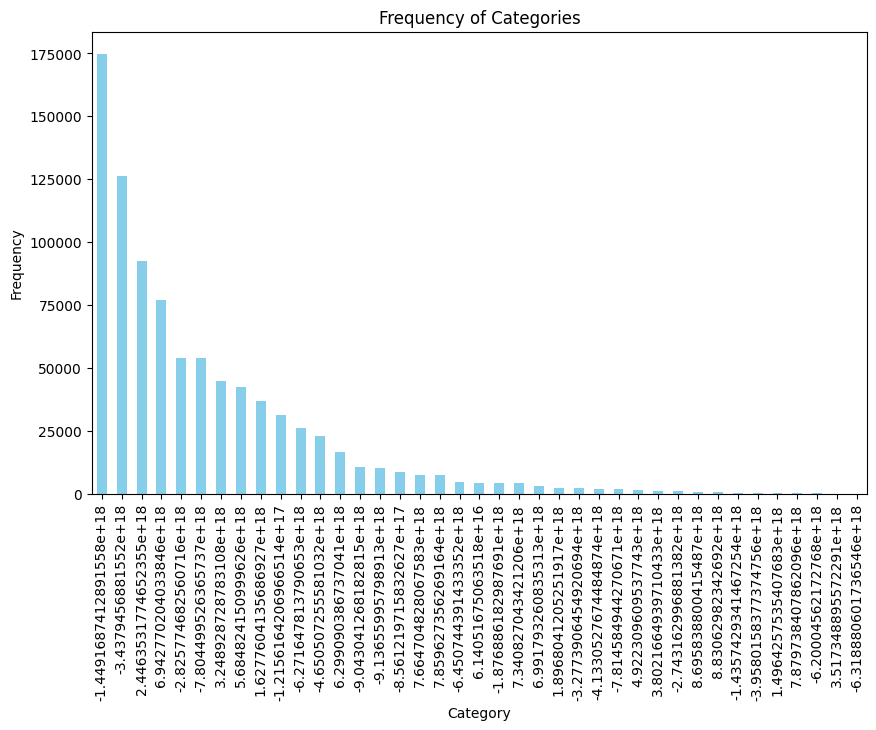

In [174]:
category_counts = crimeTrain['Category'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Frequency of Categories')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.show()

> Jak można zauważyc kradzież jest ogólnie najczętszym przestępstwem. Zobaczmy teraz jak to wygdąda w konkretnych sektorach:

/tmp/ipykernel_26731/1818077992.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


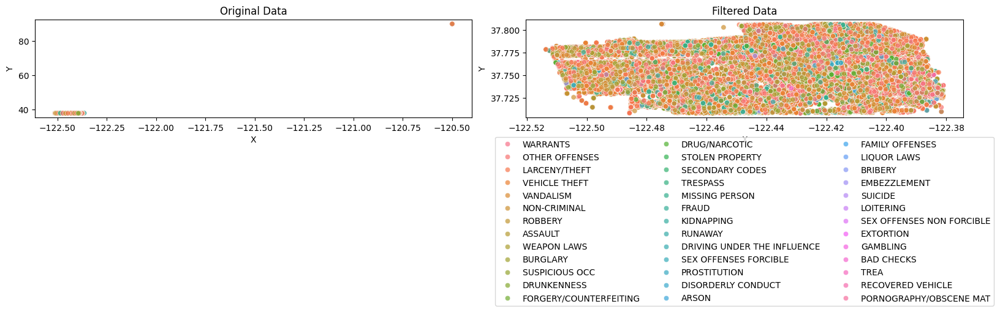

/tmp/ipykernel_26731/1818077992.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeTrain['Address_encoded'] = le_address.fit_transform(crimeTrain['Address'])
/tmp/ipykernel_26731/1818077992.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeTrain['Resolution_encoded'] = le_resolution.fit_transform(crimeTrain['Resolution'])
/tmp/ipykernel_26731/1818077992.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = 

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Address_encoded,Resolution_encoded,DayOfWeek_encoded,PdDistrict_encoded
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-0.102977,0.323218,1.689827,-1.457665,1.483974,-0.177285
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-0.102977,0.323218,1.689827,-1.457665,1.483974,-0.177285
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-0.041931,1.407333,2.169494,-1.457665,1.483974,-0.177285
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-0.147051,1.426579,-0.871743,0.678092,1.483974,-0.177285
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-0.615974,0.194824,-1.270462,0.678092,1.483974,0.174535
...,...,...,...,...,...,...,...,...,...,...,...,...,...
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-1.426465,-2.219217,1.042243,0.678092,-0.982414,1.229993
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-0.960445,-1.467884,0.328261,0.678092,-0.982414,-0.880924
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,0.795603,0.561200,0.299327,0.678092,-0.982414,0.878174
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,1.309120,0.575541,2.104769,0.678092,-0.982414,0.878174


In [8]:
x_threshold = crimeTrain['X'].quantile(0.99)  # na przykład, wartość kwantyla 0.99
y_threshold = crimeTrain['Y'].quantile(0.99)

# Filtracja danych
filtered_data = crimeTrain[(crimeTrain['X'] < x_threshold) & (crimeTrain['Y'] < y_threshold)]

# Ustawienie większego rozmiaru obu wykresów
plt.figure(figsize=(16, 6))

# Pierwszy wykres
plt.subplot(1, 2, 1)
sns.scatterplot(x='X', y='Y', data=crimeTrain, hue='Category', alpha=0.7, legend=False)
plt.title('Original Data')

# Drugi wykres
plt.subplot(1, 2, 2)
sns.scatterplot(x='X', y='Y', data=filtered_data, hue='Category', alpha=0.7)
plt.title('Filtered Data')

# Dostosuj układ, aby uniknąć nakładania się legendy na pierwszym wykresie
plt.tight_layout()

# Dostosuj legendę
plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=3)

plt.show()

crimeTrain = filtered_data


le_address = LabelEncoder()
crimeTrain['Address_encoded'] = le_address.fit_transform(crimeTrain['Address'])

# Zakodowanie kategorialnych danych rozdzielczych
le_resolution = LabelEncoder()
crimeTrain['Resolution_encoded'] = le_resolution.fit_transform(crimeTrain['Resolution'])

le_dayOfWeek = LabelEncoder()
crimeTrain['DayOfWeek_encoded'] = le_dayOfWeek.fit_transform(crimeTrain['DayOfWeek'])

le_pDistrict = LabelEncoder()
crimeTrain['PdDistrict_encoded'] = le_pDistrict.fit_transform(crimeTrain['PdDistrict'])

# Standaryzacja danych
columns_to_standardize = ['X', 'Y', 'Resolution_encoded', 'Address_encoded', 'DayOfWeek_encoded', 'PdDistrict_encoded']
scaler = StandardScaler()
crimeTrain[columns_to_standardize] = scaler.fit_transform(crimeTrain[columns_to_standardize])

# Wyświetlenie zstandaryzowanych danych
crimeTrain

Na początku trzeba było przefiltrowac dane, gdyz pojawiały się błedne, nie odwołujące sie do rozpatrywanej lokalizaji. Mimo to jest ich zbyt gęsto aby coś wyłonić, dlatego spróbujmy przedstawic je na odzzielnych wykresach.


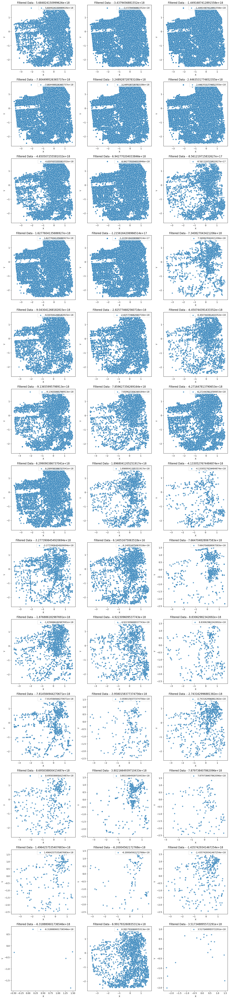

In [176]:
categories = filtered_data['Category'].unique()

# Ustal liczbę kolumn (możesz dostosować)
num_columns = 3

# Ustal liczbę wierszy na podstawie liczby kategorii i liczby kolumn
num_rows = int(np.ceil(len(categories) / num_columns))

# Tworzenie macierzy subplotów
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))

# Również, konwertuj osie na jednowymiarową tablicę, jeśli liczba wierszy lub kolumn wynosi 1
if num_rows == 1:
    axes = np.reshape(axes, (1, -1))
if num_columns == 1:
    axes = np.reshape(axes, (-1, 1))

# Iteracja po kategoriach
for i, category in enumerate(categories):
    subset = filtered_data[filtered_data['Category'] == category]
    
    # Wybór odpowiedniego subplotu
    ax = axes[i // num_columns, i % num_columns]
    
    # Tworzenie wykresu dla danej kategorii
    sns.scatterplot(x='X', y='Y', data=subset, label=category, alpha=0.7, ax=ax)
    ax.set_title(f'Filtered Data - {category}')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Ustawienia layoutu
plt.tight_layout()
plt.show()

Co mozna zauważyć to to, że najczęstrze przestępstwa są wykonywane praktyczne na całym rozpatrywanym obszarze. Największe zagęszczenie praktycznie kazdego z przestępstw jest w północno-wschodniej części miasta.
>Szczególnie jest to widoczne przy kategoriach: 
*LOITERING
*BAD CHECKS
*DISORDERLY CONDUCT
*PROSTITUTION
>Przestępstwa, który wykazują równe pokrycie na mapie to:
*FRAUD
*BURGLARY
*SUSPICIOUS OCC


In [177]:
crimeTrain

,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Year,Date,Time,Address_encoded,Resolution_encoded,DayOfWeek_encoded,PdDistrict_encoded
0,5.684824e+18,-3.015276e+18,0.333333,-6.723269e+18,2.634533e+18,-3.190942e+18,-0.102977,0.323218,2015,-6.695085e+18,8.925238e+18,-0.632321,0.915197,-0.501880,-0.579061
1,-3.437946e+18,2.270859e+18,0.333333,-6.723269e+18,2.634533e+18,-3.190942e+18,-0.102977,0.323218,2015,-6.695085e+18,8.925238e+18,-0.632321,0.915197,-0.501880,-0.579061
2,-3.437946e+18,2.270859e+18,0.333333,-6.723269e+18,2.634533e+18,-6.815851e+18,-0.041931,1.407333,2015,-6.695085e+18,-1.597332e+18,-1.311161,0.915197,-0.501880,-0.579061
3,-1.449169e+18,-3.388475e+18,0.333333,-6.723269e+18,-7.363034e+16,3.017343e+18,-0.147051,1.426579,2015,-6.695085e+18,2.002673e+18,0.572423,-0.617779,-0.501880,-0.579061
4,-1.449169e+18,-3.388475e+18,0.333333,-3.319969e+18,-7.363034e+16,-1.385350e+18,-0.615974,0.194824,2015,-6.695085e+18,2.002673e+18,-0.283991,-0.617779,-0.501880,0.804740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
878044,-4.650507e+18,3.162061e+18,0.000000,-8.356743e+18,-7.363034e+16,3.486439e+17,-1.426465,-2.219217,2003,5.947351e+18,-1.074537e+18,0.048844,-0.617779,-1.516604,-1.270961
878045,-1.449169e+18,-3.388475e+18,0.000000,-6.937194e+18,-7.363034e+16,2.663808e+18,-0.960445,-1.467884,2003,5.947351e+18,-8.854917e+18,0.504865,-0.617779,-1.516604,-0.925011
878046,-1.449169e+18,-3.388475e+18,0.000000,1.130593e+18,-7.363034e+16,-6.598103e+18,0.795603,0.561200,2003,5.947351e+18,-8.854917e+18,-1.266536,-0.617779,-1.516604,1.150690
878047,3.248929e+18,5.410189e+18,0.000000,1.130593e+18,-7.363034e+16,-6.204866e+18,1.309120,0.575541,2003,5.947351e+18,-8.854917e+18,-1.192469,-0.617779,-1.516604,1.150690


/home/banjo/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banjo/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


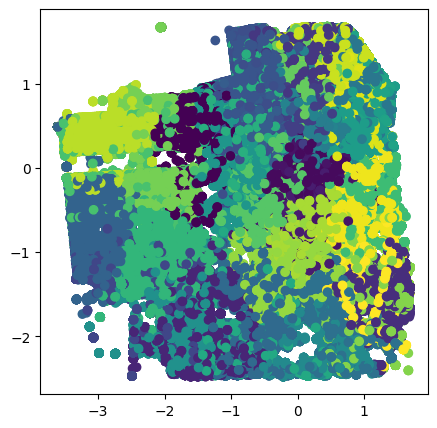

/home/banjo/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banjo/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banjo/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banjo/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. 

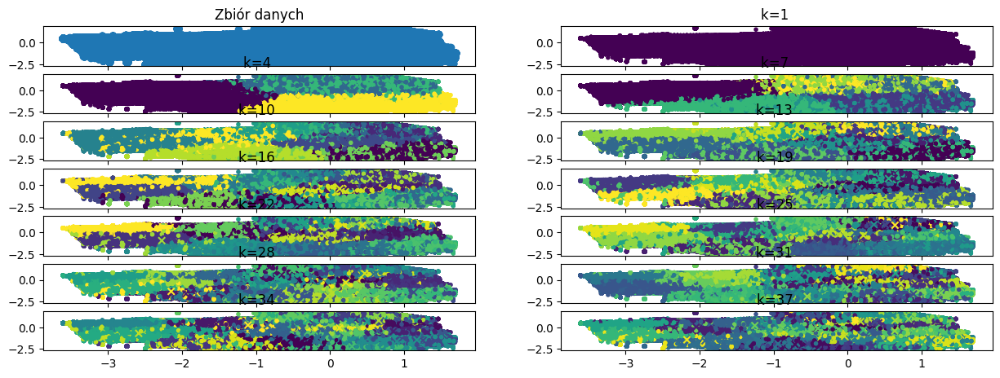

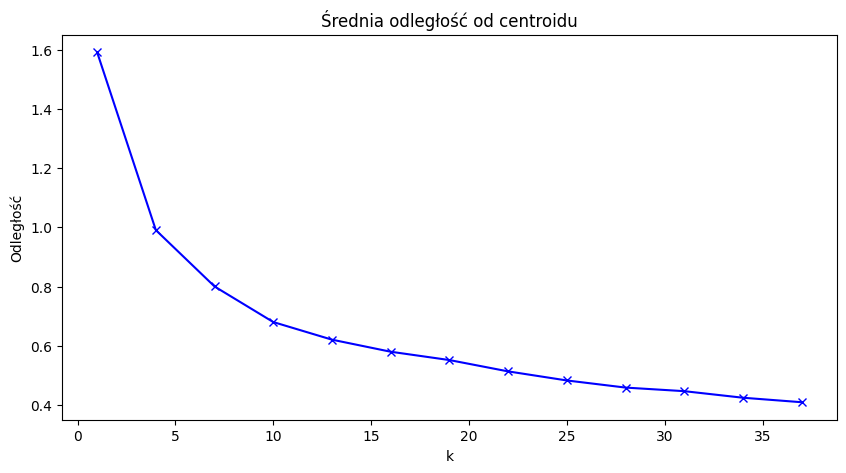

In [17]:
df = crimeTrain[['X', 'Y','Address_encoded']].copy()  # Wybierz tylko kolumny liczbowe
liczba_unikalnych = crimeTrain['Category'].nunique()
k = liczba_unikalnych
kmeans = KMeans(n_clusters=k, random_state=0)
kmeans.fit(df)
etykiety_grup = kmeans.fit_predict(df)

plt.figure(figsize=(5, 5))
plt.scatter(df['X'], df['Y'], marker='o', c=etykiety_grup)
plt.show()


maks_k = k
zakres_k = range(1, maks_k)
ile_w_pionie = int(maks_k / 2) + 1
plt.figure(figsize=(15, 15))
plt.subplot(ile_w_pionie, 2, 1)
plt.scatter(df['X'], df['Y'])
plt.title('Zbiór danych')

srednia_odl = []
pozycja = 2

for k_iter in range(1, maks_k + 1, 3):
    plt.subplot(ile_w_pionie, 2, pozycja)
    pozycja = pozycja + 1
    kmeans = KMeans(n_clusters=k_iter, random_state=0)
    etykiety_klastrow = kmeans.fit_predict(df)
    
    # Wykres klastrów
    plt.scatter(df.X, df.Y, marker='.', c=etykiety_klastrow)
    
    # Dodaj centroidy
    centroidy = kmeans.cluster_centers_
    plt.scatter(centroidy[:, 0], centroidy[:, 1], marker='x', c=np.array(range(k_iter)))
    
    plt.title('k=%s ' % k_iter)
    srednia_odl.append(sum(np.min(cdist(df, centroidy, 'euclidean'), axis=1)) / df.shape[0])

# Wykres metody "łokcia"
plt.figure(figsize=(10, 5))
plt.plot(range(1, maks_k + 1, 3), srednia_odl, 'bx-')
plt.xlabel('k')
plt.ylabel('Odległość')
plt.title('Średnia odległość od centroidu')
plt.show()

Metoda łokciowa dla uczenia nienadzorowanego aglomeracyjnego k-średnich podpowiada, ze powinnismy przyjąć 4 grupy,jednak klas jest ponad 35, wiec dla tych danych sie nie sprawdza, gdyż są one wciąż zbyt skomplikowane, aby znależść na podstawie tych atrybutów mocniejsze korelacje.

In [192]:
def podziel(df, proporcja, label_encoder=None):

    if not (0 < proporcja < 1):
        raise ValueError("Proporcja powinna być wartością pomiędzy 0 a 1.")
    df = df[df['Resolution'] != 'NONE']
    df = df[df['Resolution'] != 'ARREST, CITED']
    df = df[df['Resolution'] != 'ARREST, BOOKED']
    if label_encoder is None:
        label_encoder = LabelEncoder()
        df['Resolution_encoded'] = label_encoder.fit_transform(df['Resolution'])
        df['DayOfWeek_encoded'] = label_encoder.fit_transform(df['DayOfWeek'])
        df['Address_encoded'] = label_encoder.fit_transform(df['Address'])

    opis_ucz, opis_test, dec_ucz, dec_test = train_test_split(df[['X', 'Y', 'Resolution_encoded','Address_encoded', 'DayOfWeek_encoded']], df['Category'], test_size=proporcja, random_state=0)
    return {"opis_ucz": opis_ucz, "opis_test": opis_test, "dec_ucz": dec_ucz, "dec_test": dec_test, "label_encoder": label_encoder}

def weryfikuj(model, dane, atryb=None):
    if atryb is None:
        atryb = list(range(dane["opis_ucz"].shape[1]))

    model.fit(dane["opis_ucz"].iloc[:, atryb], dane["dec_ucz"])
    wynik_ucz = model.predict(dane["opis_ucz"].iloc[:, atryb])
    wynik_test = model.predict(dane["opis_test"].iloc[:, atryb])

    mp_ucz = confusion_matrix(dane["dec_ucz"], wynik_ucz)
    print("Macierz pomyłek - zbiór uczący, dokładność:", np.sum(np.diag(mp_ucz)) / np.sum(mp_ucz))

    mp_test = confusion_matrix(dane["dec_test"], wynik_test)
    print("Macierz pomyłek - zbiór testowy, dokładność:", np.sum(np.diag(mp_test)) / np.sum(mp_test))

# Użycie funkcji podziel
dane = podziel(crimeTrain, 0.2)

# Wybór i naucz model KNN
knn_model = KNeighborsClassifier(n_neighbors=1)  # Możesz dostosować liczbę sąsiadów
weryfikuj(knn_model, dane)
dane = podziel(crimeTrain, 0.2)

# Wybór i naucz model drzewa decyzyjnego
decision_tree_model = tree.DecisionTreeClassifier(random_state=42, max_depth=30, min_samples_leaf=5)
weryfikuj(decision_tree_model, dane)

dane = podziel(crimeTrain, 0.2)

# Wybór i naucz model najbliższego centroidu
nearest_centroid_model = NearestCentroid()
weryfikuj(nearest_centroid_model, dane)
dane = podziel(crimeTrain, 0.2)

# Wybór i naucz model najbliższego centroidu
nearest_centroid_model = GaussianNB()
weryfikuj(nearest_centroid_model, dane)

Macierz pomyłek - zbiór uczący, dokładność: 0.8068535825545171
Macierz pomyłek - zbiór testowy, dokładność: 0.46239303407896715
Macierz pomyłek - zbiór uczący, dokładność: 0.6932027174117029
Macierz pomyłek - zbiór testowy, dokładność: 0.5511935144873142
Macierz pomyłek - zbiór uczący, dokładność: 0.006568329392335698
Macierz pomyłek - zbiór testowy, dokładność: 0.006830806185257469
Macierz pomyłek - zbiór uczący, dokładność: 0.5327853469954584
Macierz pomyłek - zbiór testowy, dokładność: 0.5262723314817594


Widzimy ze słabo sobie radzi, spróbujmy pominac te dane, gdzi kary nie było

Spróbujmy teraz zobaczyć jak model se poradzi po zredukowanej liczbie nachodzących na siebie danych.

Nie dało nam to lepszych rezultatów, gdyż wiekszośc danych wciaż na siebie nachodzi i jest zbyt duzo kategori, zeby tak nie było, wiec lepiej pozostać przy wszystkich kategoriach, i nie filtrowac